In [17]:
# widing my cells 
from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [18]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import functions as fs
import numpy as np
import re
import plotly.express as px
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set_theme(context = 'poster' , style = 'ticks' , palette = 'magma' , font_scale = 0.6 , rc = {'figure.figsize':[18 , 8]})

In [19]:
df = pd.read_csv('DatafrmaeCopy.csv')
df

,price (million),geo_lat,geo_lon,building_type,level,levels,rooms,area,kitchen_area,object_type,Datetime
0,4.999999,59.958459,30.215529,Brick,8.0,13.0,1.0,36.00,7.20,Secondary Real Estate,2018-10-20 22:11:49
1,2.150000,45.072674,41.936996,Brick,5.0,5.0,1.0,52.00,15.00,Secondary Real Estate,2019-08-23 16:39:54
2,8.600000,59.939359,30.437068,Monolithic,11.0,22.0,1.0,37.10,9.80,Secondary Real Estate,2021-01-21 18:39:45
3,5.100000,59.740478,30.569539,Panel,2.0,9.0,3.0,74.50,9.50,Secondary Real Estate,2020-07-18 17:51:46
4,3.470000,56.324063,44.005391,Monolithic,11.0,26.0,2.0,54.00,8.00,New Building,2019-07-11 12:21:25
...,...,...,...,...,...,...,...,...,...,...,...
48714,7.093280,55.916540,37.710144,Panel,11.0,25.0,3.0,68.80,12.40,New Building,2018-12-31 08:58:26
48715,3.600000,45.061372,38.962089,Other,13.0,24.0,1.0,40.63,11.00,Secondary Real Estate,2020-03-11 05:45:23
48716,13.500000,55.747042,37.863328,Panel,1.0,16.0,3.0,72.00,10.00,Secondary Real Estate,2020-06-09 12:54:12
48717,1.470000,49.935245,40.559080,Monolithic,1.0,5.0,1.0,36.40,8.50,Secondary Real Estate,2019-02-21 07:20:04


# Feature Extraction

### Read City data After Extracting it from lat&long features

In [20]:
city = pd.read_csv('finalcity.csv')
city

,City
0,St. Petersburg
1,Stavropol
2,St. Petersburg
3,Kolpino
4,Nizhny Novgorod
...,...
47485,Mytishchi
47486,Krasnodar
47487,NaN
47488,NaN


In [21]:
df = pd.concat([df,city],axis=1) ## there is nulls because the city data is less than our dataframe 

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48719 entries, 0 to 48718
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   price (million)  48719 non-null  float64
 1   geo_lat          48049 non-null  float64
 2   geo_lon          48149 non-null  float64
 3   building_type    48505 non-null  object 
 4   level            48523 non-null  float64
 5   levels           48497 non-null  float64
 6   rooms            48372 non-null  float64
 7   area             48175 non-null  float64
 8   kitchen_area     47875 non-null  float64
 9   object_type      48115 non-null  object 
 10  Datetime         47845 non-null  object 
 11  City             39349 non-null  object 
dtypes: float64(8), object(4)
memory usage: 4.8+ MB


## Extracting season,year, month

In [23]:
df['Datetime'] = pd.to_datetime(df['Datetime'], errors='coerce') # convert it to Date time

In [24]:
df['season'] = pd.to_datetime(df.Datetime.dt.date).apply(fs.season_of_date)

In [25]:
df['year'] = df.Datetime.dt.year

In [26]:
df['month'] = df.Datetime.dt.month

In [27]:
df.head()

,price (million),geo_lat,geo_lon,building_type,level,levels,rooms,area,kitchen_area,object_type,Datetime,City,season,year,month
0,4.999999,59.958459,30.215529,Brick,8.0,13.0,1.0,36.0,7.2,Secondary Real Estate,2018-10-20 22:11:49,St. Petersburg,autumn,2018.0,10.0
1,2.150000,45.072674,41.936996,Brick,5.0,5.0,1.0,52.0,15.0,Secondary Real Estate,2019-08-23 16:39:54,Stavropol,summer,2019.0,8.0
2,8.600000,59.939359,30.437068,Monolithic,11.0,22.0,1.0,37.1,9.8,Secondary Real Estate,2021-01-21 18:39:45,St. Petersburg,winter,2021.0,1.0
3,5.100000,59.740478,30.569539,Panel,2.0,9.0,3.0,74.5,9.5,Secondary Real Estate,2020-07-18 17:51:46,Kolpino,summer,2020.0,7.0
4,3.470000,56.324063,44.005391,Monolithic,11.0,26.0,2.0,54.0,8.0,New Building,2019-07-11 12:21:25,Nizhny Novgorod,summer,2019.0,7.0


In [28]:
df.to_csv('dataforbi.csv',index=False)

# Client Questions

## 1- in each year what is the min, max,mean,no of occurence  price for each bulding_type ?

In [29]:
df.groupby(['year', 'building_type'])['price (million)'].agg(['max','min','mean','count']) ## price in million rubel

max   min      mean  count
year   building_type                                  
2018.0 Blocky         16.500000  0.55  2.910876    221
       Brick          19.111000  0.50  3.224764   2659
       Monolithic     19.120000  0.54  4.811956   1357
       Other          17.340101  0.90  4.231611    395
       Panel          16.000000  0.50  2.711120   3015
       Wooden         17.159800  0.55  3.669957     24
2019.0 Blocky         18.000000  0.60  3.174295    638
       Brick          19.067000  0.50  3.424755   6370
       Monolithic     19.000000  0.60  5.361631   3379
       Other          17.500000  0.75  3.795071    891
       Panel          19.000000  0.50  2.800591   8238
       Wooden          8.000000  0.50  1.620417     48
2020.0 Blocky         17.000000  0.55  3.512634    478
       Brick          19.019000  0.50  3.668506   5752
       Monolithic     19.153910  0.76  5.712608   3637
       Other          18.400000  0.50  4.611873   1048
       Panel          19.000000  0.51  3.685035   4435
       Wooden          9.900000  0.50  1.620232     43
2021.0 Blocky         19.000000  0.90  4.261194    125
       Brick          18.816596  0.50  4.433428   1769
       Monolithic     19.148220  0.85  6.565754   1240
       Other          18.051680  0.80  5.509525    304
       Panel          19.000000  0.70  4.354702   1558
       Wooden         10.900000  0.65  3.354444      9

Text(0.5, 1.0, 'count for each type per each year')

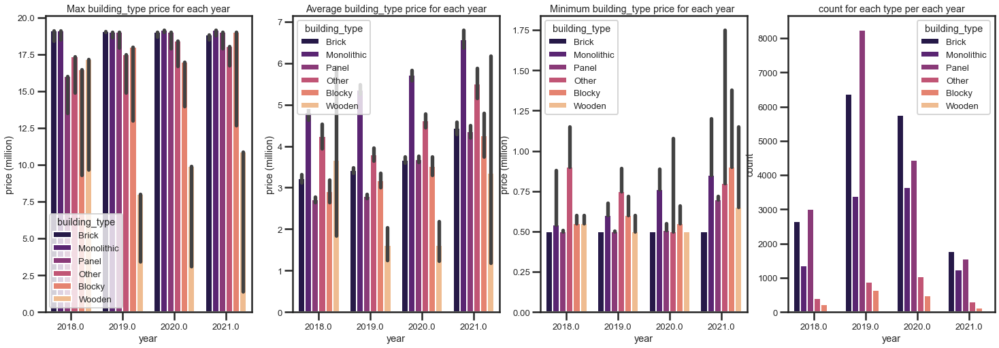

In [30]:
# Creating a grid figure with matplotlib
fig, my_grid = plt.subplots(nrows=1, ncols=4, figsize=(25,8))


# First plot
a = sns.barplot(y= df['price (million)'],x=df['year'], hue=df['building_type'],estimator=np.max,ax=my_grid[0]) # bar plot 1 data
a.set_title('Max building_type price for each year')

# Second plot
a = sns.barplot(y= df['price (million)'],x=df['year'], hue=df['building_type'],estimator=np.mean,ax=my_grid[1]) # bar plot 2 data
a.set_title('Average building_type price for each year')

# third plot
a = sns.barplot(y= df['price (million)'],x=df['year'], hue=df['building_type'],estimator=np.min,ax=my_grid[2]) # bar plot 3 data
a.set_title('Minimum building_type price for each year ')

#4rth plot
a = sns.countplot(df['year'], hue= df['building_type']) # count plot 4 data
a.set_title('count for each type per each year')

## 2- what is the total average prices per each year?

In [31]:
x =df.groupby('year')['price (million)'].mean().sort_values(ascending=False).to_frame().T
x

year,2021.0,2020.0,2019.0,2018.0
price (million),5.000427,4.208201,3.500233,3.34723


<AxesSubplot:xlabel='year', ylabel='price (million)'>

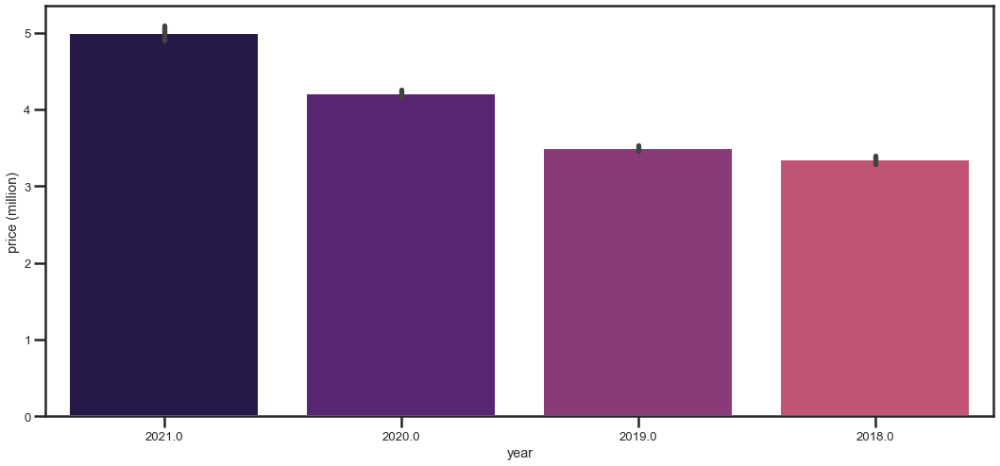

In [32]:
sns.barplot(x= df['year'], y=df['price (million)'],order=x.columns)

## 3- in each  month what is the average price for each bulding_type?

In [33]:
x = pd.pivot_table(data=df,index='building_type',columns='month',values ='price (million)',aggfunc=np.mean)
x

month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
building_type,,,,,,,,,,,,
Blocky,3.161728,2.843411,3.491284,3.614107,3.357655,3.108135,3.356591,3.005228,3.478548,3.374858,3.476689,3.382540
Brick,3.423766,3.627058,3.844831,3.880473,3.331006,3.601911,3.491973,3.558943,3.479912,3.635345,3.563894,3.372799
Monolithic,5.397791,5.383127,5.812920,5.963586,5.610893,5.289581,5.924990,5.157936,5.274066,5.526801,5.555212,5.609036
Other,4.256386,4.213542,4.704028,4.786335,4.468969,4.483643,4.440927,4.738743,4.898050,4.010170,3.743372,3.668402
Panel,3.043680,3.272313,3.280308,3.408299,2.884293,3.044941,3.078494,2.881314,3.032000,3.093998,3.169588,3.374680
Wooden,4.235000,1.247500,1.279231,2.096364,2.356250,1.714286,1.298182,0.975000,1.451187,5.345998,1.145000,1.560000


<AxesSubplot:xlabel='month', ylabel='building_type'>

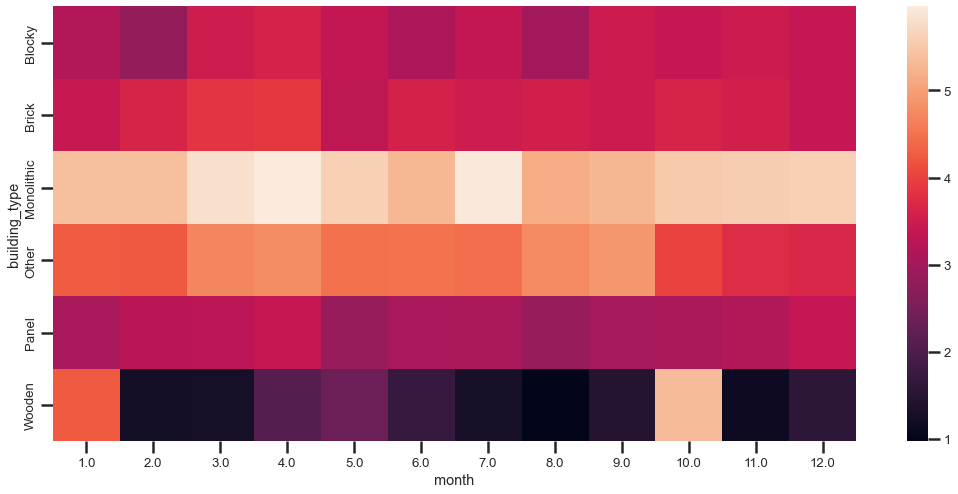

In [34]:
sns.heatmap(x,cmap='rocket')

<AxesSubplot:xlabel='building_type', ylabel='price (million)'>

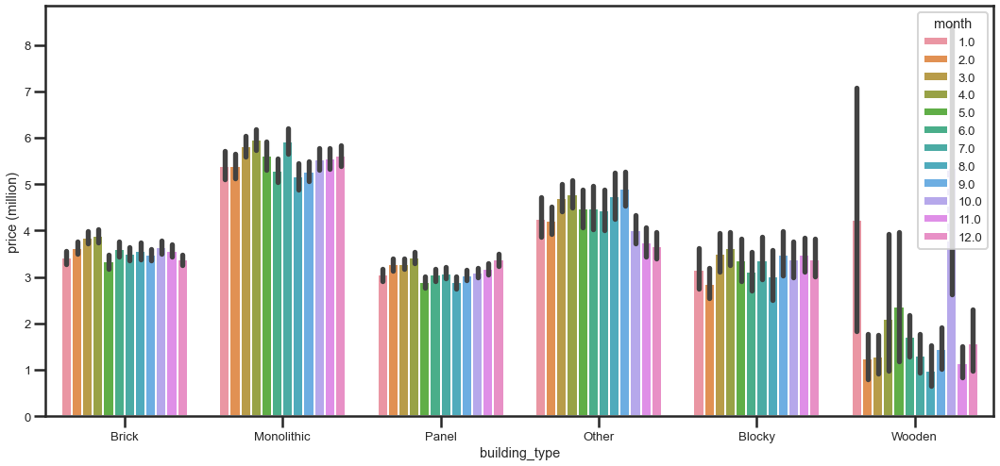

In [35]:
sns.barplot(data=df, x='building_type', y='price (million)', hue='month')

## 4- which bulding type and object_type dominates the data?

In [36]:
px.pie(df[~df['object_type'].isnull()], names='object_type',title='Most object_type', width=600, height=400)


* Secondary Real Estate Most Common

## 5- calssify the data according to the price (low, medium, high) and then show the classifictaion of each building type according to 'price_status'?

In [150]:
df['price_status'] = df['price (million)'].apply(fs.binning_price)
df['price_status'].unique()

array(['Low', 'Medium', 'High'], dtype=object)

In [151]:
#First_way
df.groupby(['building_type','price_status'])['price_status'].count().to_frame()

price_status
building_type price_status              
Blocky        High                    33
              Low                   1272
              Medium                 187
Brick         High                   656
              Low                  13800
              Medium                2390
Monolithic    High                  1171
              Low                   5629
              Medium                2978
Other         High                   128
              Low                   1938
              Medium                 632
Panel         High                   487
              Low                  15105
              Medium                1972
Wooden        High                     4
              Low                    117
              Medium                   6

In [152]:
#Second_way
pd.pivot_table(data=df, index='building_type', columns='price_status',values='object_type',aggfunc=len).T

building_type,Blocky,Brick,Monolithic,Other,Panel,Wooden
price_status,,,,,,
High,33,656,1171,128,487,4
Low,1272,13800,5629,1938,15105,117
Medium,187,2390,2978,632,1972,6


<AxesSubplot:xlabel='building_type', ylabel='count'>

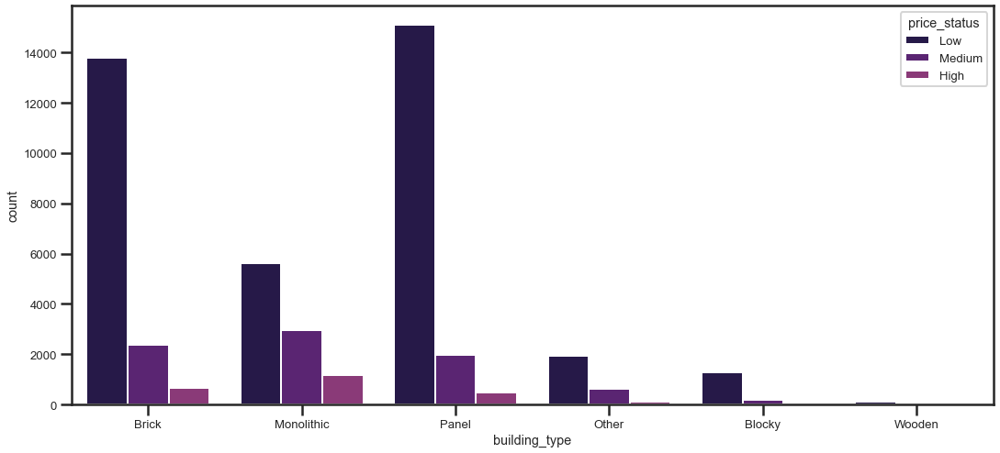

In [153]:
sns.countplot(data=df, x='building_type', hue='price_status')

## 6- show the occurance of each object_type according to 'price_status'?

In [154]:
#First_way
df.groupby(['object_type','price_status'])['price_status'].count().to_frame()

price_status
object_type           price_status              
New Building          High                   936
                      Low                  10446
                      Medium                2809
Secondary Real Estate High                  1525
                      Low                  27114
                      Medium                5285

In [155]:
#Second_way
pd.pivot_table(data=df, index='object_type', columns='price_status',values='building_type',aggfunc=len).T

object_type,New Building,Secondary Real Estate
price_status,,
High,936,1525
Low,10446,27114
Medium,2809,5285


<AxesSubplot:xlabel='object_type', ylabel='count'>

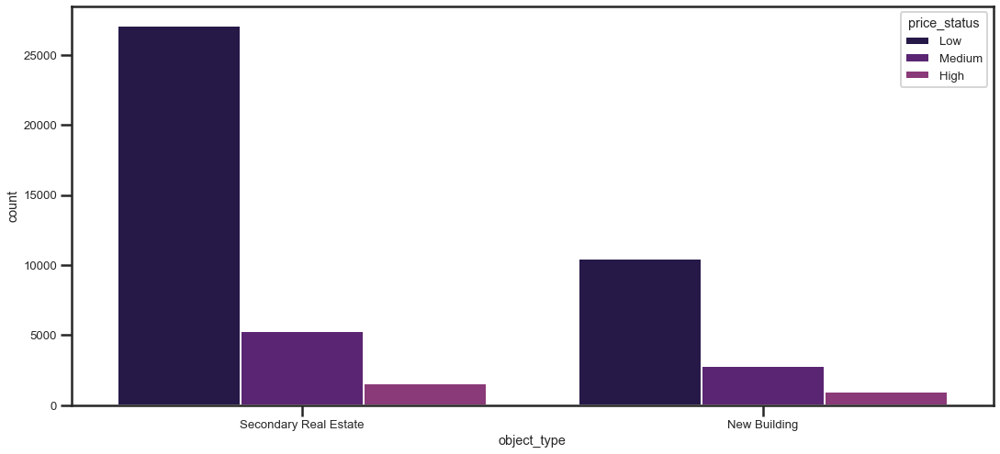

In [156]:
sns.countplot(data=df, x='object_type', hue='price_status')

## 7- what is the min, max,mean price of object_type & building_type for data that classified as high price? 

In [166]:
high = df[df.price_status == 'High']
high.head(5)

,price (million),geo_lat,geo_lon,building_type,level,levels,rooms,area,kitchen_area,object_type,Datetime,City,season,year,month,price_status
13,10.300000,59.976200,30.316340,Monolithic,1.0,13.0,2.0,69.2,10.9,Secondary Real Estate,2019-10-11 12:55:10,St. Petersburg,autumn,2019.0,10.0,High
51,15.000000,55.690547,37.721642,Brick,10.0,12.0,2.0,50.0,8.0,Secondary Real Estate,2021-04-11 11:23:00,Moscow,spring,2021.0,4.0,High
68,12.380851,59.982522,30.322105,Brick,7.0,14.0,2.0,74.2,22.3,New Building,2020-12-18 12:10:16,St. Petersburg,autumn,2020.0,12.0,High
82,12.500000,55.795738,37.782978,Brick,2.0,5.0,3.0,68.8,7.7,Secondary Real Estate,2019-05-21 09:32:29,Moscow,spring,2019.0,5.0,High
120,18.669690,59.906242,30.317494,Monolithic,7.0,8.0,2.0,76.8,26.5,New Building,2019-01-05 14:17:22,Magnitogorsk,winter,2019.0,1.0,High


In [167]:
high.groupby('object_type')['price (million)'].agg(['min','max','mean'])

,min,max,mean
object_type,,,
New Building,10.0,19.15391,13.175581
Secondary Real Estate,10.0,19.11100,13.163013


In [168]:
high.groupby('building_type')['price (million)'].agg(['min','max','mean']).T

building_type,Blocky,Brick,Monolithic,Other,Panel,Wooden
min,10.000000,10.000000,10.00000,10.000000,10.000000,10.90000
max,19.000000,19.111000,19.15391,18.400000,19.000000,17.15980
mean,13.077273,13.166958,13.44810,12.915109,12.547407,14.83852


Text(0.5, 1.0, 'Minimum building_type for high Prices')

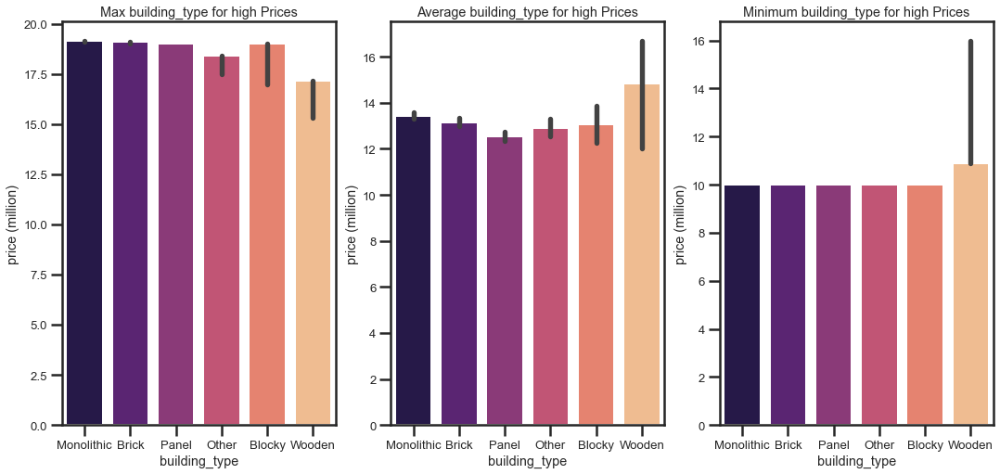

In [169]:
# Creating a grid figure with matplotlib
fig, my_grid = plt.subplots(nrows=1, ncols=3, figsize=(18,8))


# First plot
a = sns.barplot(y= high['price (million)'], x=high['building_type'],estimator=np.max,ax=my_grid[0]) # bar plot 1 data
a.set_title('Max building_type for high Prices')

# Second plot
a = sns.barplot(y= high['price (million)'], x=high['building_type'],estimator=np.mean,ax=my_grid[1]) # bar plot 1 data
a.set_title('Average building_type for high Prices')

# third plot
a = sns.barplot(y= high['price (million)'], x=high['building_type'],estimator=np.min,ax=my_grid[2]) # Scatter plot 1 data
a.set_title('Minimum building_type for high Prices')

## 8- what is the min, max,mean price for data that classified as medium price?

In [105]:
med = df[df.price_status == 'Medium']
med.head(5)

,price (million),geo_lat,geo_lon,building_type,level,levels,rooms,area,kitchen_area,object_type,Datetime,City,season,year,month,price_status
2,8.600,59.939359,30.437068,Monolithic,11.0,22.0,1.0,37.1,9.8,Secondary Real Estate,2021-01-21 18:39:45,St. Petersburg,winter,2021.0,1.0,Medium
3,5.100,59.740478,30.569539,Panel,2.0,9.0,3.0,74.5,9.5,Secondary Real Estate,2020-07-18 17:51:46,Kolpino,summer,2020.0,7.0,Medium
6,8.750,59.963620,30.281642,Brick,3.0,7.0,1.0,49.0,12.0,Secondary Real Estate,2018-11-06 19:35:58,St. Petersburg,autumn,2018.0,11.0,Medium
8,7.803,55.722482,37.774804,Monolithic,14.0,30.0,1.0,45.9,23.6,New Building,2020-06-30 18:09:03,Moscow,summer,2020.0,6.0,Medium
16,5.999,54.979454,83.050620,Brick,4.0,10.0,3.0,77.1,12.4,New Building,2018-12-30 03:33:05,Novosibirsk,winter,2018.0,12.0,Medium


In [106]:
med.groupby('object_type')['price (million)'].agg(['min','max','mean'])

,min,max,mean
object_type,,,
New Building,5.000107,9.990000,6.906459
Secondary Real Estate,5.004700,9.999999,6.847488


In [107]:
med.groupby('building_type')['price (million)'].agg(['min','max','mean']).T

building_type,Blocky,Brick,Monolithic,Other,Panel,Wooden
min,5.070000,5.010300,5.002000,5.009687,5.000107,5.821065
max,9.990000,9.999999,9.999900,9.990000,9.999999,9.950000
mean,7.001795,6.790618,6.944056,6.735428,6.877079,8.207649


Text(0.5, 1.0, 'Minimum building_type for medium Prices')

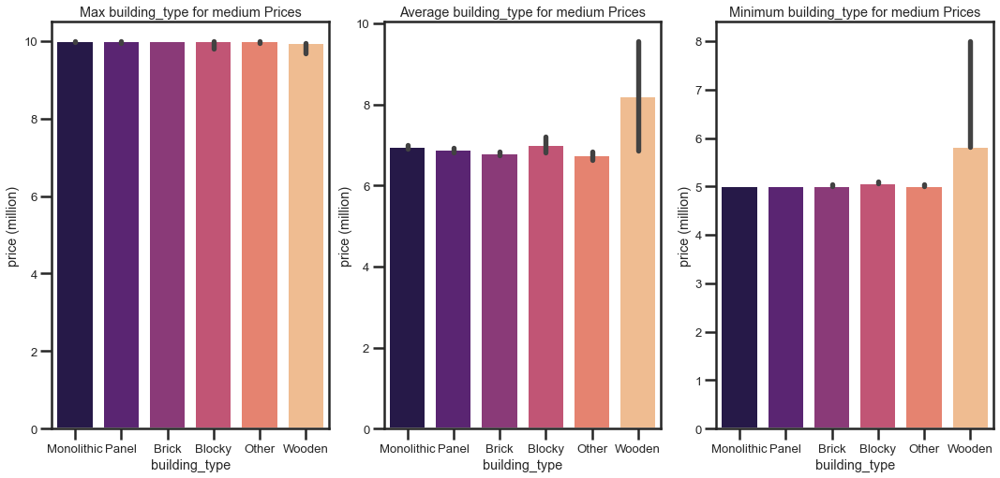

In [170]:
# Creating a grid figure with matplotlib
fig, my_grid = plt.subplots(nrows=1, ncols=3, figsize=(18,8))


# First plot
a = sns.barplot(y= med['price (million)'], x=med['building_type'],estimator=np.max,ax=my_grid[0]) # bar plot 1 data
a.set_title('Max building_type for medium Prices')

# Second plot
a = sns.barplot(y= med['price (million)'], x=med['building_type'],estimator=np.mean,ax=my_grid[1]) # bar plot 1 data
a.set_title('Average building_type for medium Prices')

# third plot
a = sns.barplot(y= med['price (million)'], x=med['building_type'],estimator=np.min,ax=my_grid[2]) # Scatter plot 1 data
a.set_title('Minimum building_type for medium Prices')

## 9-what is the min, max,mean price for data that classified as low price?

In [108]:
low = df[df.price_status == 'Low']
low.head(5)

,price (million),geo_lat,geo_lon,building_type,level,levels,rooms,area,kitchen_area,object_type,Datetime,City,season,year,month,price_status
0,4.999999,59.958459,30.215529,Brick,8.0,13.0,1.0,36.0,7.2,Secondary Real Estate,2018-10-20 22:11:49,St. Petersburg,autumn,2018.0,10.0,Low
1,2.150000,45.072674,41.936996,Brick,5.0,5.0,1.0,52.0,15.0,Secondary Real Estate,2019-08-23 16:39:54,Stavropol,summer,2019.0,8.0,Low
4,3.470000,56.324063,44.005391,Monolithic,11.0,26.0,2.0,54.0,8.0,New Building,2019-07-11 12:21:25,Nizhny Novgorod,summer,2019.0,7.0,Low
5,4.150000,55.803909,38.433659,Panel,9.0,10.0,3.0,67.0,8.0,Secondary Real Estate,2019-01-17 16:27:17,Electrostal,winter,2019.0,1.0,Low
7,1.260000,52.065755,113.364794,NaN,1.0,5.0,1.0,37.0,7.0,Secondary Real Estate,2019-07-11 16:00:40,Chita,summer,2019.0,7.0,Low


In [109]:
low.groupby('object_type')['price (million)'].agg(['min','max','mean'])

,min,max,mean
object_type,,,
New Building,0.5,5.0,2.557292
Secondary Real Estate,0.5,5.0,2.623172


In [110]:
low.groupby('building_type')['price (million)'].agg(['min','max','mean']).T

building_type,Blocky,Brick,Monolithic,Other,Panel,Wooden
min,0.550000,0.500000,0.540000,0.500000,0.500000,0.500000
max,5.000000,5.000000,5.000000,5.000000,5.000000,4.300000
mean,2.531816,2.579233,3.201159,3.052381,2.366225,1.397427


Text(0.5, 1.0, 'Minimum building_type for low Prices')

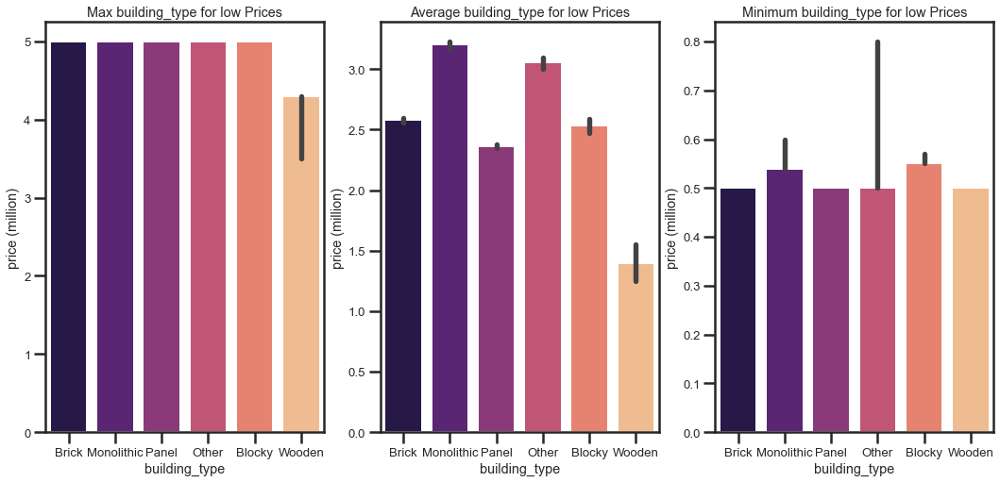

In [171]:
# Creating a grid figure with matplotlib
fig, my_grid = plt.subplots(nrows=1, ncols=3, figsize=(18,8))


# First plot
a = sns.barplot(y= low['price (million)'], x=low['building_type'],estimator=np.max,ax=my_grid[0]) # bar plot 1 data
a.set_title('Max building_type for low Prices')

# Second plot
a = sns.barplot(y= low['price (million)'], x=low['building_type'],estimator=np.mean,ax=my_grid[1]) # bar plot 1 data
a.set_title('Average building_type for low Prices')

# third plot
a = sns.barplot(y= low['price (million)'], x=low['building_type'],estimator=np.min,ax=my_grid[2]) # Scatter plot 1 data
a.set_title('Minimum building_type for low Prices')

## 10- which city recorded the the highest gain of selling (summ) ?

In [172]:
x = df.groupby('City')['price (million)'].sum().sort_values(ascending=False).head()
x

City
city district of Novosibirsk    24795.756740
Krasnodar                       13431.244871
St. Petersburg                  13150.691386
Moscow                          10784.814038
Novosibirsk                      9189.125953
Name: price (million), dtype: float64

<AxesSubplot:xlabel='City', ylabel='price (million)'>

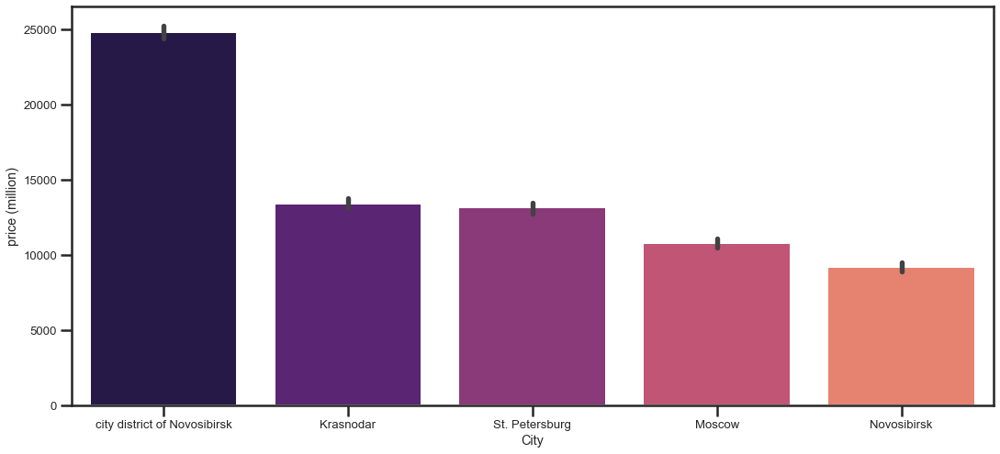

In [173]:
sns.barplot(data=df[df['City'].isin(x.index)], x='City', y='price (million)',order=x.index, estimator=sum)

## 11- what are the 5 most cities occured ?

In [174]:
most5 = df.City.value_counts().head()
most5

city district of Novosibirsk    6450
Krasnodar                       3482
St. Petersburg                  3311
Moscow                          2818
Novosibirsk                     2350
Name: City, dtype: int64

<AxesSubplot:xlabel='City', ylabel='count'>

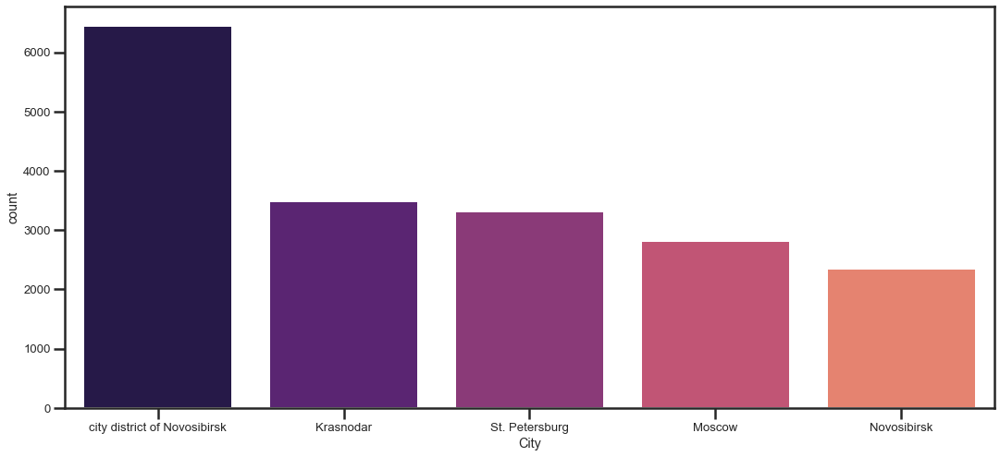

In [175]:
sns.countplot(data=df[df.City.isin(most5.index)],x= 'City',order=most5.index)

## 12- according to cities what is the occourence object_type  (show 50 city)?

In [178]:
pd.pivot_table(data=df, index='City', columns='object_type', values ='price_status', aggfunc=len ).head(50)

object_type,New Building,Secondary Real Estate
City,,
Abakan,17.0,48.0
Achinsk,5.0,9.0
Almetyevsk,2.0,3.0
Angarsk,29.0,47.0
Arkhangelsk,7.0,18.0
Armavir,9.0,24.0
Arzamas,11.0,36.0
Astrakhan,6.0,10.0
Balaklava district,NaN,1.0


<AxesSubplot:xlabel='City', ylabel='count'>

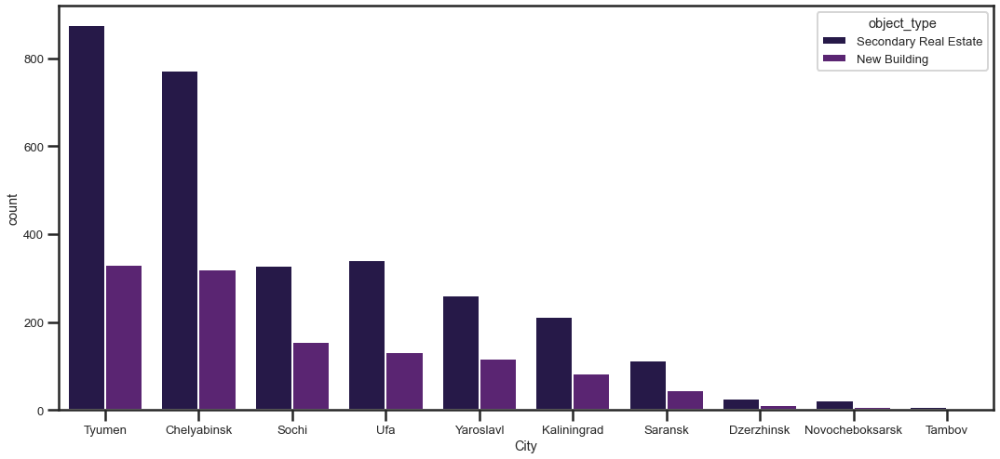

In [274]:
#By taking sample from the data (10 cities) just for ploting ^_^
y = df.City.unique()[20:30]
x = df[df.City.isin(y)]['City'].value_counts()
sns.countplot(data= df[df.City.isin(y)] , x = 'City', hue= 'object_type', order=x.index)

## 13- which building type got a higher price according to object type ? 

In [181]:
pd.pivot_table(data=df, index='object_type', columns='building_type', values = 'price (million)', aggfunc=np.mean)

building_type,Blocky,Brick,Monolithic,Other,Panel,Wooden
object_type,,,,,,
New Building,2.635895,3.718806,5.890090,4.304117,2.582870,6.133333
Secondary Real Estate,3.438710,3.567748,5.226828,4.462698,3.382725,2.074372


<AxesSubplot:xlabel='object_type', ylabel='price (million)'>

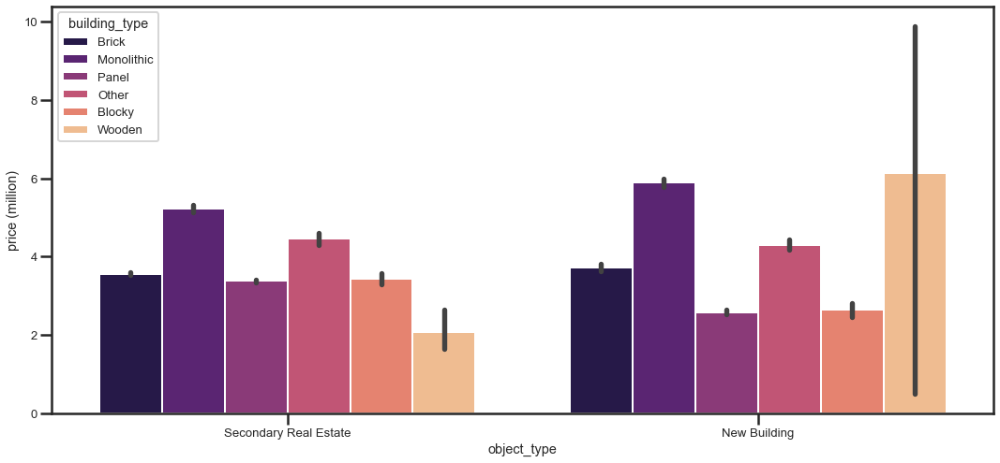

In [182]:
sns.barplot(data=df, x = 'object_type', y='price (million)', hue='building_type')

* Monolithic break the higher average prcie in Secondary Real Estate type
* Wooden break the higher average prcie in new_building type (outliers i guess)

## 14- is there any correlation between price and area, kitchen_area?

In [183]:
x = df.loc[:,['price (million)', 'area','kitchen_area']].corr()
x

,price (million),area,kitchen_area
price (million),1.000000,0.315395,0.384922
area,0.315395,1.000000,0.338079
kitchen_area,0.384922,0.338079,1.000000


<AxesSubplot:>

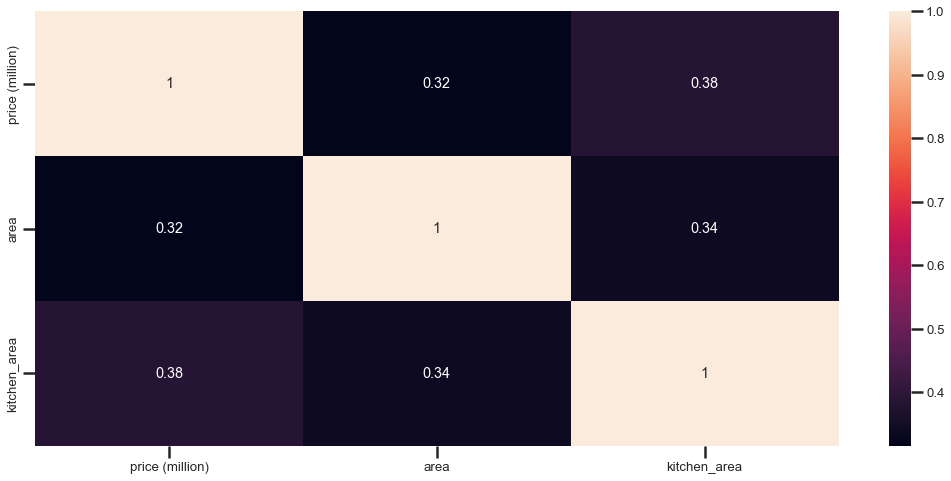

In [184]:
sns.heatmap(annot=True, data= x)

Text(0.5, 1.0, 'area & Kitchen_Area Correlation')

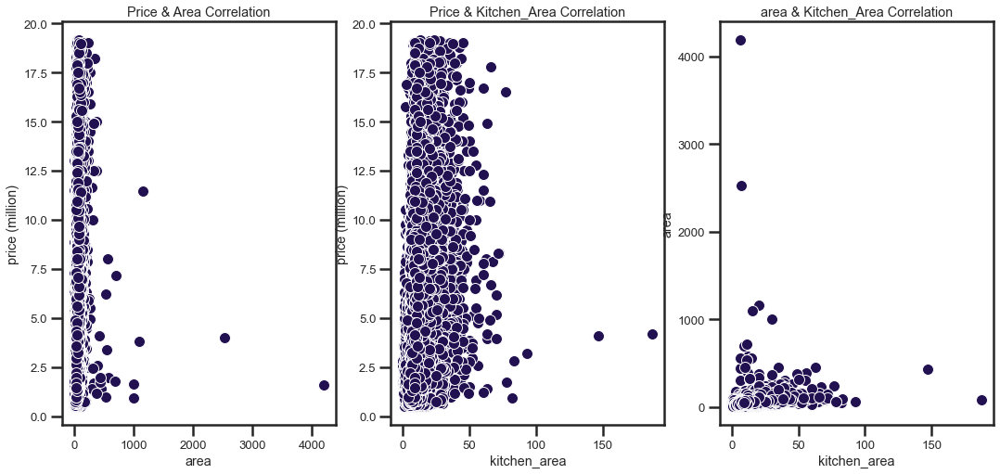

In [185]:
# Creating a grid figure with matplotlib
fig, my_grid = plt.subplots(nrows=1, ncols=3, figsize=(18,8))


# First plot
a = sns.scatterplot(y= df['price (million)'], x=df['area'],ax=my_grid[0]) # Scatter plot 1 data
a.set_title('Price & Area Correlation')


# Second plot
a = sns.scatterplot(y= df['price (million)'], x=df['kitchen_area'],ax=my_grid[1]) # Scatter plot 1 data
a.set_title('Price & Kitchen_Area Correlation')


# third plot
a = sns.scatterplot(y= df['area'], x=df['kitchen_area'],ax=my_grid[2]) # Scatter plot 1 data
a.set_title('area & Kitchen_Area Correlation')

* There Is No Correlation between them

## 15- is there any correlation between price and level & levels?

In [186]:
x = df.loc[:,['price (million)', 'level','levels']].corr()
x

,price (million),level,levels
price (million),1.000000,0.238068,0.348365
level,0.238068,1.000000,0.656784
levels,0.348365,0.656784,1.000000


<AxesSubplot:>

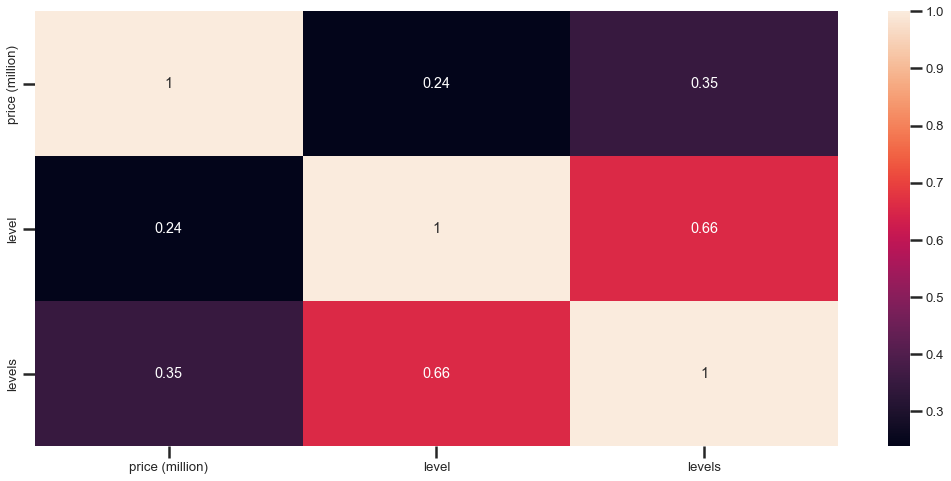

In [187]:
sns.heatmap(annot=True, data= x)

Text(0.5, 1.0, 'level & levels Correlation')

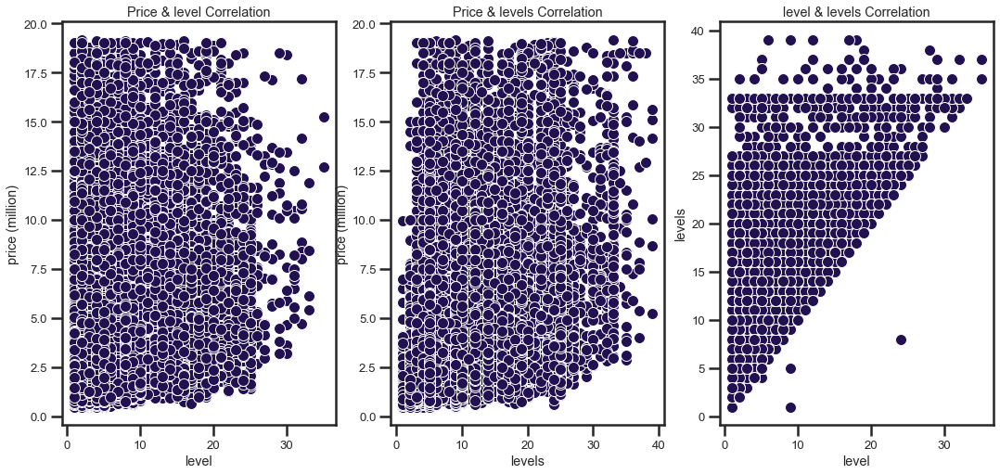

In [188]:
# Creating a grid figure with matplotlib
fig, my_grid = plt.subplots(nrows=1, ncols=3, figsize=(18,8))


# First plot
a = sns.scatterplot(y= df['price (million)'], x=df['level'],ax=my_grid[0]) # Scatter plot 1 data
a.set_title('Price & level Correlation')


# Second plot
a = sns.scatterplot(y= df['price (million)'], x=df['levels'],ax=my_grid[1]) # Scatter plot 1 data
a.set_title('Price & levels Correlation')


# third plot
a = sns.scatterplot(y= df['levels'], x=df['level'],ax=my_grid[2]) # Scatter plot 1 data
a.set_title('level & levels Correlation')

* between level& levels there is a correlation
* there is no correlation between price and (level- levels)

## 16- for each bulding type what is the maximum number of rooms?

In [189]:
x = df.groupby('building_type')['rooms'].max().sort_values(ascending=False).to_frame()
x

,rooms
building_type,
Brick,9.0
Panel,9.0
Monolithic,8.0
Blocky,6.0
Wooden,6.0
Other,5.0


<AxesSubplot:xlabel='building_type', ylabel='rooms'>

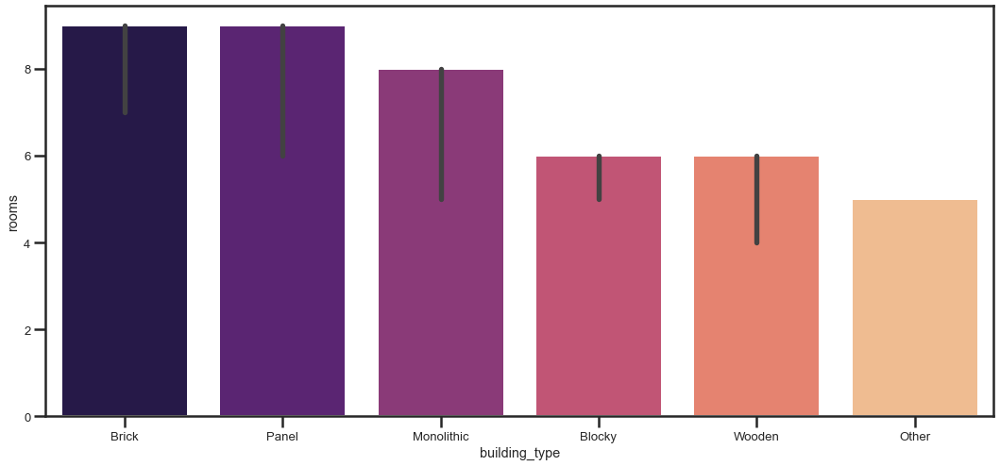

In [190]:
sns.barplot(data=df, x='building_type', y= 'rooms', estimator=max, order=x.index)

## 17- for each city what is the average price (take 50 city sample)?

In [191]:
y = df.City.unique()[:50]
x = df[df.City.isin(y)]
x.groupby('City')['price (million)'].mean().sort_values(ascending=False).to_frame()

,price (million)
City,
Kaspiysk,4.603627
Vladikavkaz,4.403121
Tambov,4.394901
Chita,4.232003
Yaroslavl,4.074117
Ulyanovsk,4.050935
Kamensk-Uralsky,4.032343
Krasnoyarsk,4.026629
Yekaterinburg,4.014659


## 18- what is the min, max,average number of rooms for each buildingtype and is there difference if we grouped it by (object_types)?

* 1st Question

In [112]:
df.groupby('building_type')['rooms'].agg(['min','max','mean']).T

building_type,Blocky,Brick,Monolithic,Other,Panel,Wooden
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
max,6.000000,9.000000,8.000000,5.000000,9.000000,6.000000
mean,1.769595,1.816356,1.561747,1.566991,1.681954,2.198413


* the value (-1) means that this apartment is studio kind

* 2nd Question

In [116]:
pd.pivot_table(data=df, index='object_type',columns='building_type',values='rooms',aggfunc=(['min','max','mean']))

min                                        max        \
building_type         Blocky Brick Monolithic Other Panel Wooden Blocky Brick   
object_type                                                                     
New Building            -1.0  -1.0       -1.0  -1.0  -1.0    1.0    4.0   6.0   
Secondary Real Estate   -1.0  -1.0       -1.0  -1.0  -1.0   -1.0    6.0   9.0   

                                                         mean            \
building_type         Monolithic Other Panel Wooden    Blocky     Brick   
object_type                                                               
New Building                 5.0   5.0   5.0    6.0  1.562814  1.558327   
Secondary Real Estate        8.0   5.0   9.0    5.0  1.809373  1.863478   

                                                                
building_type         Monolithic     Other     Panel    Wooden  
object_type                                                     
New Building            1.568200  1.489811  1.307418  3.333333  
Secondary Real Estate   1.556297  1.641553  1.836346  2.183333

## 19- what is the most common rooms number and level number  according to each buliding type?

In [207]:
df.groupby('building_type')[['rooms']].apply(lambda x: x.mode())

,,rooms
building_type,,
Blocky,0,1.0
Brick,0,1.0
Monolithic,0,1.0
Other,0,1.0
Panel,0,1.0
Wooden,0,3.0


<AxesSubplot:xlabel='building_type', ylabel='count'>

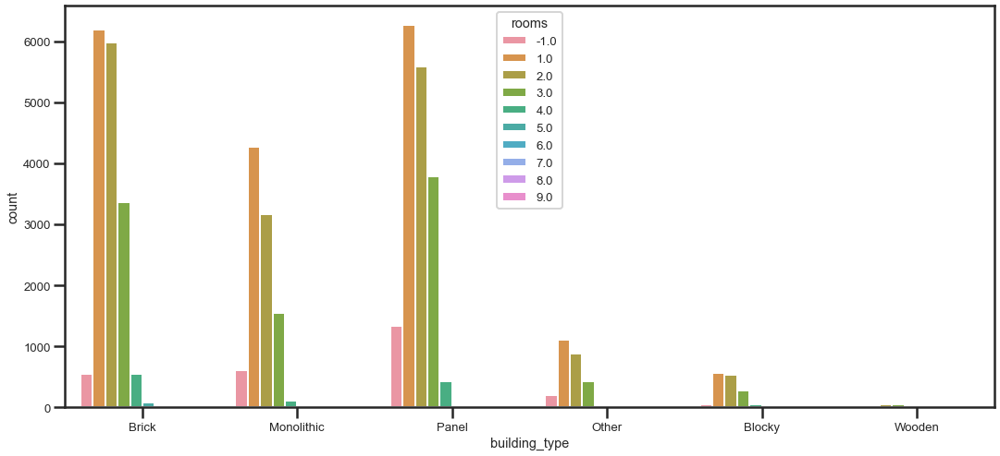

In [275]:
sns.countplot(x=df['building_type'], hue=df['rooms'])

* most no of rooms for wooden buildings 3 rooms and 1 for other kinds

## 20- show the correlation between all numerical data?

In [212]:
x = df.corr()
x

,price (million),geo_lat,geo_lon,level,levels,rooms,area,kitchen_area,year,month
price (million),1.000000,0.188807,-0.328878,0.238068,0.348365,0.329003,0.315395,0.384922,0.168379,-0.014189
geo_lat,0.188807,1.000000,0.127705,0.043668,0.088588,0.000318,-0.012815,-0.038286,0.038839,-0.009577
geo_lon,-0.328878,0.127705,1.000000,-0.097509,-0.138354,-0.053398,0.001344,-0.124955,-0.108780,-0.037475
level,0.238068,0.043668,-0.097509,1.000000,0.656784,-0.060913,0.032338,0.187320,0.048995,-0.002920
levels,0.348365,0.088588,-0.138354,0.656784,1.000000,-0.119667,0.034616,0.260307,0.071422,-0.003023
rooms,0.329003,0.000318,-0.053398,-0.060913,-0.119667,1.000000,0.459206,0.250375,-0.007734,0.013316
area,0.315395,-0.012815,0.001344,0.032338,0.034616,0.459206,1.000000,0.338079,0.000274,-0.006210
kitchen_area,0.384922,-0.038286,-0.124955,0.187320,0.260307,0.250375,0.338079,1.000000,0.035255,0.006827
year,0.168379,0.038839,-0.108780,0.048995,0.071422,-0.007734,0.000274,0.035255,1.000000,-0.469604
month,-0.014189,-0.009577,-0.037475,-0.002920,-0.003023,0.013316,-0.006210,0.006827,-0.469604,1.000000


<AxesSubplot:>

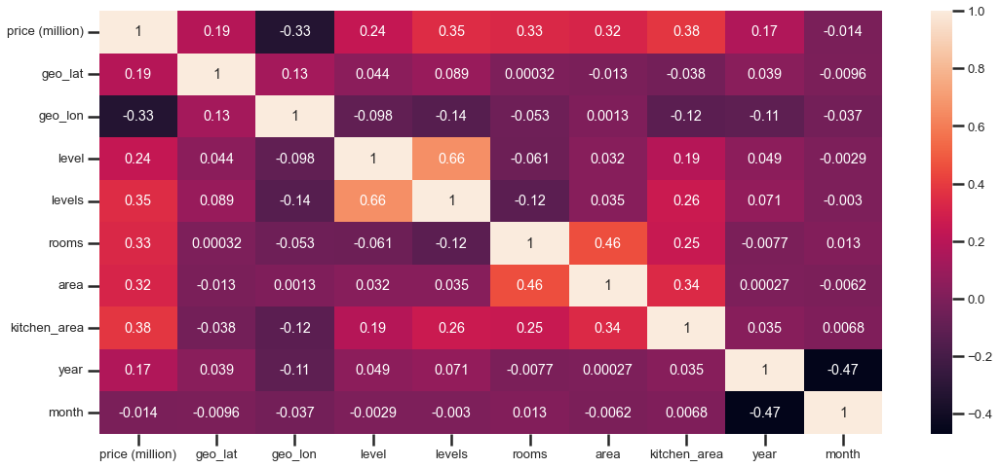

In [213]:
sns.heatmap(x, annot=True)

## 21- according to each season determine the min, max and average price and plot only the mean?

In [222]:
x = df.groupby('season')['price (million)'].agg(['max','mean','min']).T
x

season,autumn,spring,summer,winter
max,19.12000,19.153910,19.067000,19.000000
mean,3.82066,3.979904,3.753175,3.888496
min,0.50000,0.500000,0.500000,0.500000


Text(0.5, 1.0, 'Price average per each season')

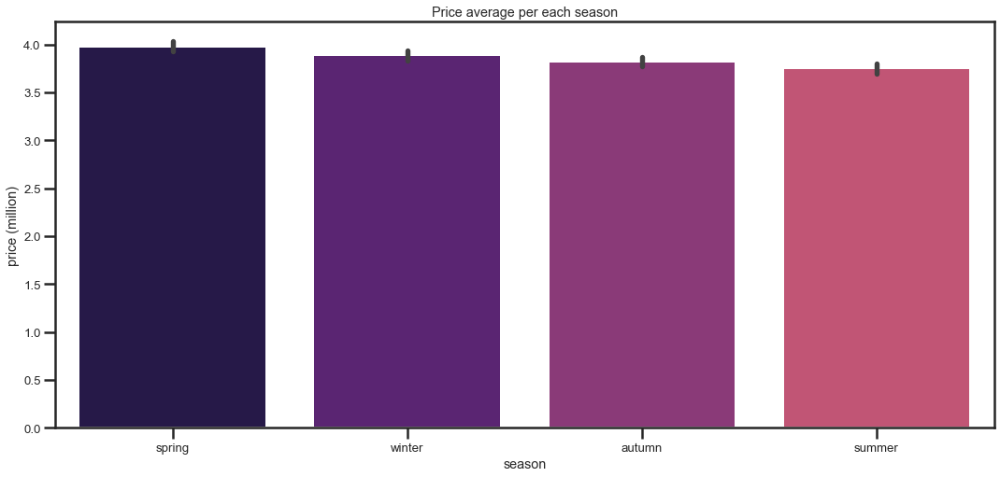

In [223]:
a = sns.barplot(y= df['price (million)'], x=df['season'],order=x.loc['mean'].sort_values(ascending= False).index)
a.set_title('Price average per each season')

## 22- for each city is there is a difference in average prices per each season  (take random sample of cities)?

In [255]:
x = pd.DataFrame(df.City.unique(),columns=['City'])
sample_1 = x.sample(5,random_state=2)
sample_2 = x.sample(5,random_state=3)

##### Sample1

In [250]:
df[df['City'].isin(sample_1['City'])].groupby(['City','season'])['price (million)'].mean().to_frame().T

City            City District Yoshkar-Ola                                \
season                             autumn    spring    summer    winter   
price (million)                   4.46485  3.705337  3.927162  3.988245   

City              Derbent                         Kaspiysk            \
season             autumn spring summer    winter   autumn    spring   
price (million)  5.108694    4.8  3.435  2.298571  5.07487  5.452977   

City                             Ryazan                            Yaroslavl  \
season             summer winter autumn    spring summer    winter    autumn   
price (million)  2.946371  4.792  3.162  2.720736   2.58  3.876786  4.179125   

City                                          
season            spring    summer    winter  
price (million)  4.14125  3.980582  3.991278

<AxesSubplot:xlabel='City', ylabel='price (million)'>

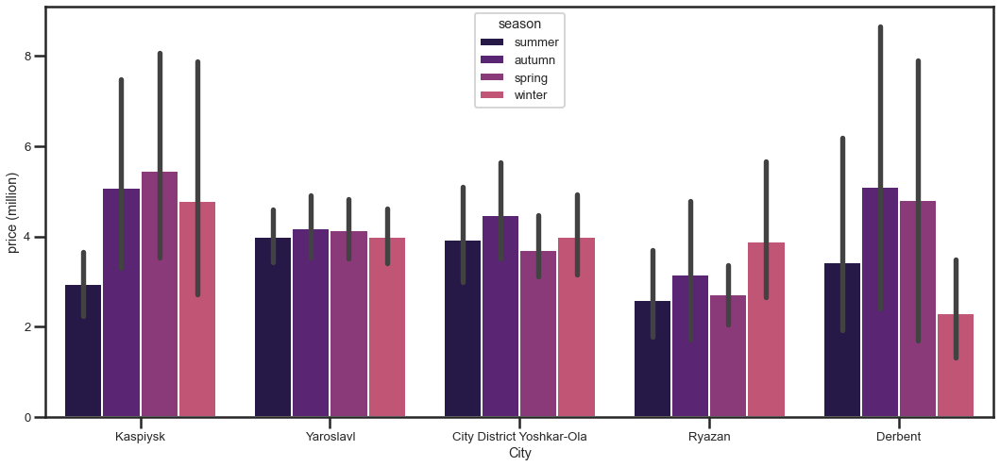

In [251]:
sns.barplot(data=df[df['City'].isin(sample_1['City'])], x='City', hue='season', y='price (million)')

* i Guess Tha (Kaspiysk,Derbent) Cities are Coastal cities or cities that depends on seasons because it changes seasonaly (in my opinion)

In [252]:
#Sample2
df[df['City'].isin(sample_2['City'])].groupby(['City','season'])['price (million)'].mean().to_frame().T

City            City District Kyzyl               City District Volgograd  \
season                       autumn spring winter                  autumn   
price (million)                1.86   2.35  2.635                3.325714   

City                                       Lipetsk            Samara  \
season             spring    summer winter  autumn  spring    autumn   
price (million)  2.735714  4.328889  3.669  5.3495  3.1375  4.116398   

City                                           Tyumen                      \
season             spring  summer    winter    autumn    spring    summer   
price (million)  5.140449  4.2455  4.011617  3.796292  4.211726  3.616346   

City                       
season             winter  
price (million)  3.699817

<AxesSubplot:xlabel='City', ylabel='price (million)'>

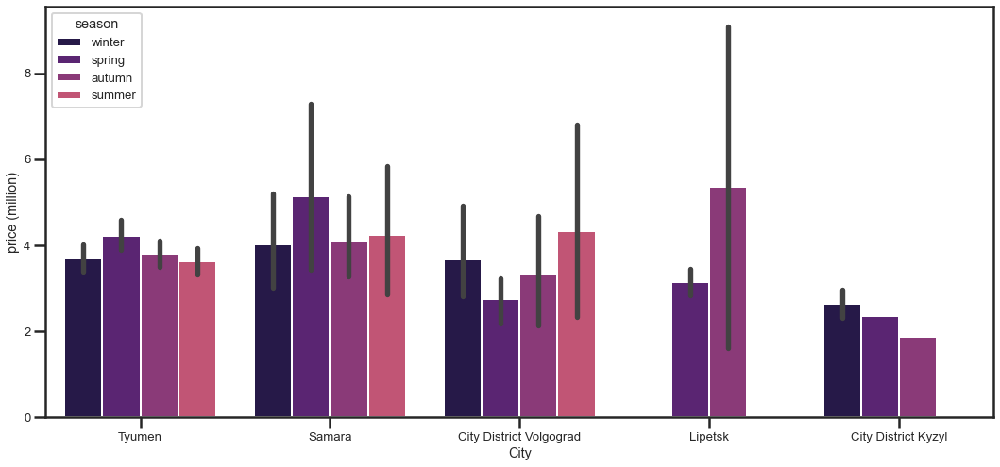

In [253]:
sns.barplot(data=df[df['City'].isin(sample_2['City'])], x='City', hue='season', y='price (million)')

* Also (lipetsk,city District Volgograd) Cities are Coastal cities or cities that depends on seasons because it changes seasonaly (in my opinion)

## 23- show the average price for each month per each year?

In [272]:
pd.pivot_table(data=df, index='year', columns='month', values = 'price (million)',aggfunc=np.mean)

month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
year,,,,,,,,,,,,
2018.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.490000,3.449970,3.288646,3.316597,3.352919
2019.0,3.298781,3.307498,3.320165,3.490010,3.349978,3.464468,3.512035,3.313172,3.621495,3.834575,4.000120,3.769873
2020.0,3.816363,3.856816,4.081486,4.065204,3.889507,4.063996,4.192761,4.126890,4.214547,4.582740,4.560649,5.078286
2021.0,4.622839,4.985330,5.126951,5.025796,5.162474,NaN,NaN,NaN,NaN,NaN,NaN,NaN


* it seems that the data recorded from 2018-08 to 2021-5

<AxesSubplot:xlabel='year', ylabel='price (million)'>

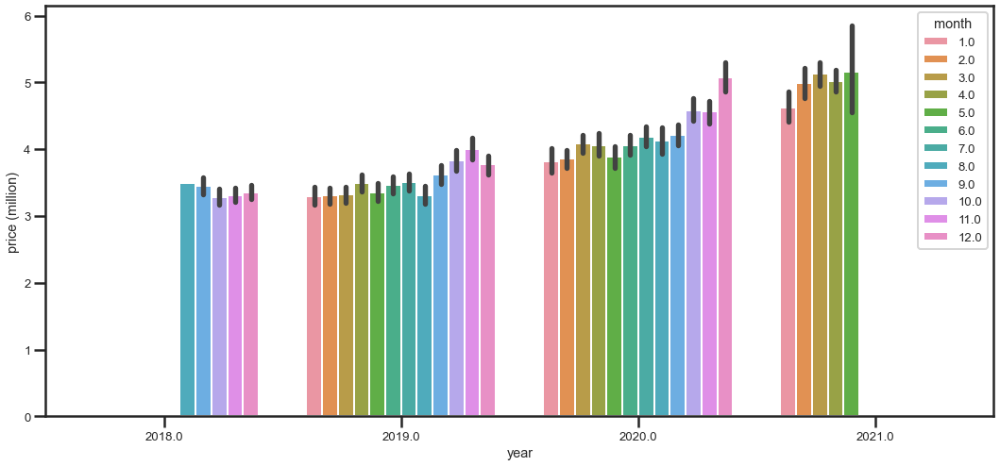

In [273]:
sns.barplot(data=df, x='year', y='price (million)', hue= 'month')

## 24- what buliding_type breaks the most summation price?

In [37]:
 px.pie(df[~df['building_type'].isnull()], values='price (million)', names='building_type',
color_discrete_sequence=px.colors.sequential.RdBu, width=700, height=500)

In [307]:
df.groupby('building_type')['price (million)'].sum().sort_values(ascending=False).to_frame().T

building_type,Brick,Panel,Monolithic,Other,Blocky,Wooden
price (million),60460.518238,55414.015813,54446.44893,11825.438944,4961.355061,272.098965


## By Anas Awad